<a href="https://colab.research.google.com/github/TAMIDSpiyalong/2025-Texas-GIS-Day/blob/main/Lecture_5_diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stable Diffusion


In [1]:
!pip install -qqq transformers accelerate diffusers

In [2]:
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
import matplotlib.pyplot as plt
from tqdm import tqdm
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import requests
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Using device: cuda




---



## Hugging Face Diffusers


### Introduction to Hugging Face Diffusers

Hugging Face Diffusers is a powerful library that provides a unified interface for working with various diffusion models, including Stable Diffusion. It simplifies the process of using state-of-the-art generative AI models, making them accessible to developers and researchers.

### Key Features of Diffusers

1. **Pre-trained Models**:
   - Offers a wide range of pre-trained diffusion models, including multiple versions of Stable Diffusion.
   - Enables easy experimentation with different model architectures and training datasets.

2. **Pipeline Abstraction**:
   - Encapsulates the entire generation process in a user-friendly pipeline.
   - Handles text encoding, noise generation, and the iterative denoising process internally.

3. **Customization Options**:
   - Allows fine-tuning of various parameters like guidance scale and number of inference steps.
   - Supports advanced techniques such as prompt weighting and negative prompts.

4. **Hardware Optimization**:
   - Provides built-in support for GPU acceleration and mixed-precision inference.
   - Enables efficient use of computational resources, crucial for real-time applications.

5. **Interoperability**:
   - Seamlessly integrates with other PyTorch-based libraries and workflows.
   - Facilitates easy incorporation of diffusion models into larger AI systems or applications.

### Working with Stable Diffusion

Stable Diffusion, accessed through the Diffusers library, offers several advantages:

1. **Text-to-Image Generation**:
   - Converts textual descriptions into high-quality images.
   - Supports a wide range of concepts, styles, and compositions.

2. **Controllable Generation**:
   - Guidance scale parameter allows balancing between creativity and prompt adherence.
   - Number of inference steps can be adjusted to trade off between quality and speed.

3. **Extensibility**:
   - Supports advanced techniques like img2img, inpainting, and outpainting.
   - Can be fine-tuned on custom datasets for specialized applications.

### Practical Applications

The combination of Hugging Face Diffusers and Stable Diffusion enables a wide range of applications:

- **Content Creation**: Assisting artists and designers in generating visual concepts.
- **Data Augmentation**: Creating diverse datasets for machine learning tasks.
- **Prototyping**: Rapidly visualizing ideas in fields like product design or architecture.
- **Educational Tools**: Illustrating complex concepts or historical scenes.
- **Entertainment**: Powering creative tools in gaming or interactive media.


In [3]:
def setup_diffusion_model():
    model_id = "runwayml/stable-diffusion-v1-5"
    pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
    return pipe.to(device)

def generate_image_diffusers(pipe, prompt, num_images=1, guidance_scale=7.5, num_inference_steps=50):
    images = pipe(
        [prompt] * num_images,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images
    return images


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  0%|          | 0/50 [00:00<?, ?it/s]

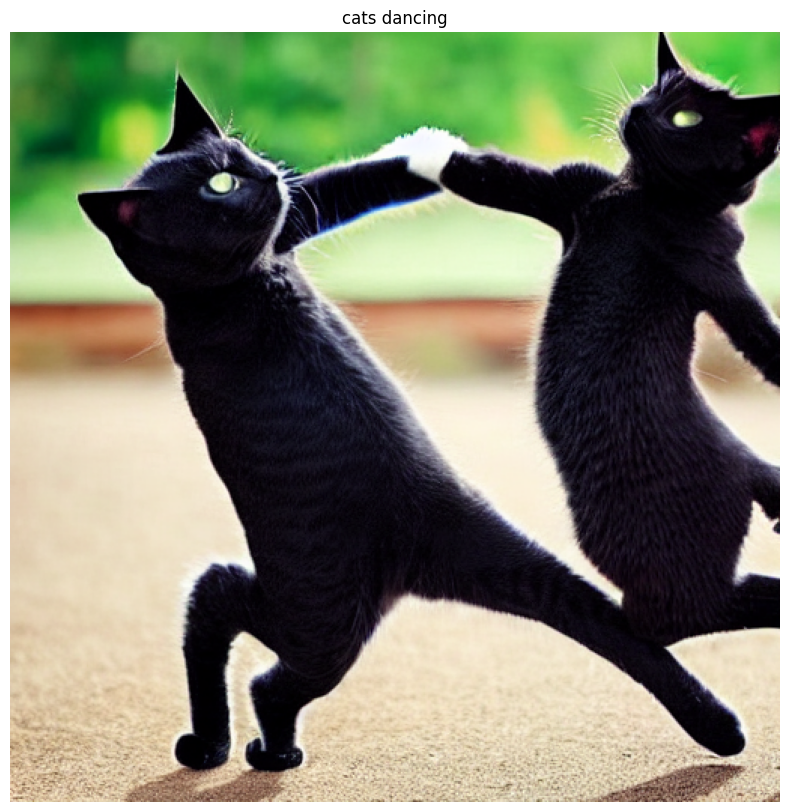

In [4]:
pipe = setup_diffusion_model()

# Generate a single image
prompt = "cats dancing"
generated_images = generate_image_diffusers(pipe, prompt)
plt.figure(figsize=(10, 10))
plt.imshow(generated_images[0])
plt.axis('off')
plt.title(prompt)
plt.show()

Generating Multiple Images

In [5]:
def generate_multiple_images(pipe, prompt, num_images=4):
    images = generate_image_diffusers(pipe, prompt, num_images)

    fig, axes = plt.subplots(2, 2, figsize=(20, 20))
    for i, img in enumerate(images):
        ax = axes[i // 2, i % 2]
        ax.imshow(img)
        ax.axis('off')

    fig.suptitle(prompt, fontsize=16)
    plt.tight_layout()
    plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

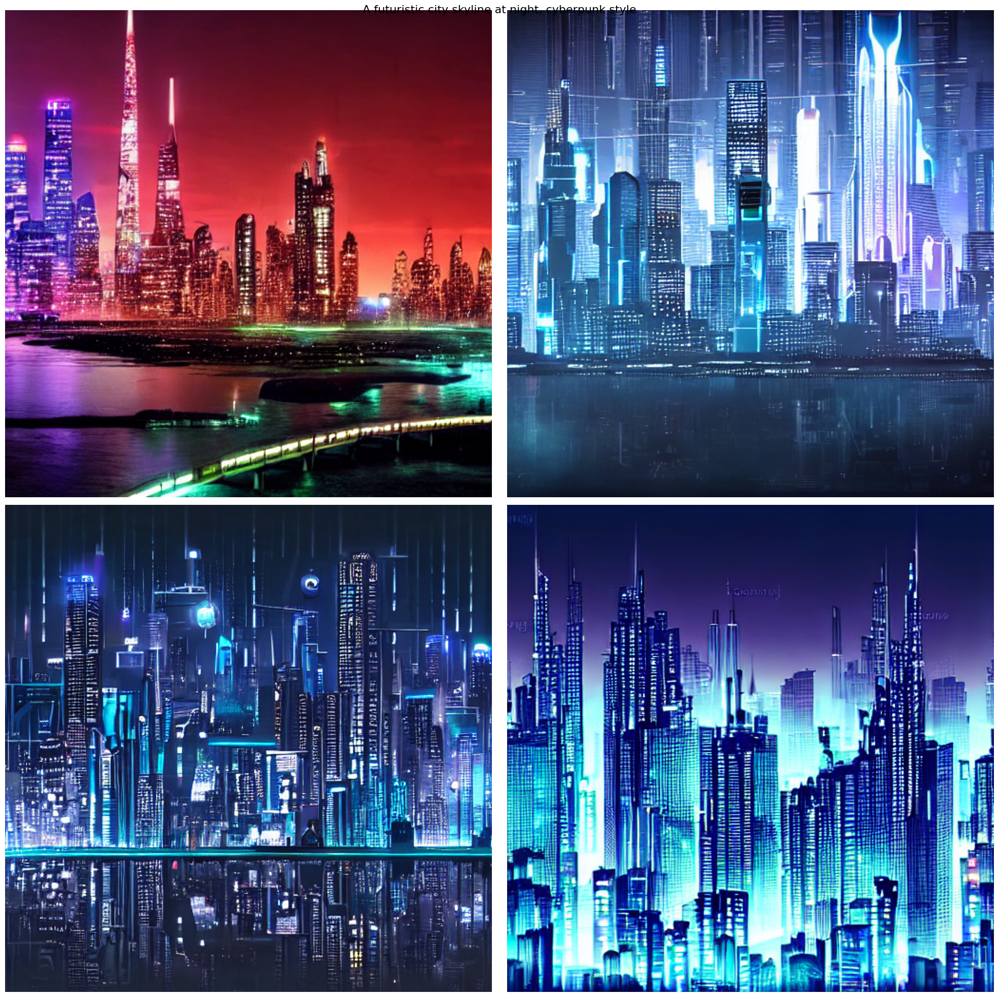

In [6]:
# Generate multiple images
prompt = "A futuristic city skyline at night, cyberpunk style"
generate_multiple_images(pipe, prompt)

### Exploring Guidance Scales in Stable Diffusion

The `compare_guidance_scales` function allows us to visualize the effects of different classifier-free guidance scales in the Stable Diffusion model. This parameter plays a crucial role in the balance between unconditional and conditional generation.

### Technical Background:

1. **Classifier-Free Guidance**:
   Stable Diffusion uses a technique called classifier-free guidance to steer the diffusion process towards the desired output. The guidance scale (ω) determines the strength of this steering.

2. **Mathematical Formulation**:
   Given an unconditional score $u_Θ(x_t, t)$ and a conditional score $c_\theta(x_t, t)$, the guided score is computed as:
   
   $$s_Θ(x_t, t) = u_Θ(x_t, t) + ω * (c_Θ(x_t, t) - u_Θ(x_t, t))$$

   Where:
   - x_t is the noisy image at timestep t
   - ω is the guidance scale

3. **Impact on Generation**:
   - When ω = 1, the model follows its natural, unguided diffusion process.
   - As ω increases, the model more strongly favors the conditional distribution, adhering more closely to the prompt.

### Function Implementation Details:

1. **Image Generation**:
   For each guidance scale, the function calls `generate_image_diffusers`, which internally uses the Stable Diffusion pipeline with the specified guidance_scale parameter.

2. **Sampling Process**:
   Higher guidance scales effectively increase the signal-to-noise ratio in the reverse diffusion process, potentially leading to sharper but possibly less diverse outputs.

3. **Visualization**:
   The function creates a matplotlib figure with subplots, each showing an image generated with a different guidance scale. This allows for direct visual comparison of the guidance scale's effects.

### Key Technical Considerations:

- **Non-linearity**: The effect of the guidance scale is not linear. Doubling the scale doesn't necessarily double the "adherence" to the prompt.
- **Model Architecture Interaction**: The impact of guidance scales can vary depending on the specific architecture and training of the Stable Diffusion model.
- **Computational Implications**: Higher guidance scales don't significantly increase computation time, as the core diffusion process remains the same.


By systematically varying the guidance scale, we can gain insights into the model's behavior and find optimal settings for different applications, balancing prompt adherence with image quality and diversity.

In [7]:
def compare_guidance_scales(pipe, prompt, scales=[5.0, 7.5, 10.0, 15.0]):
    images = []
    for scale in scales:
        img = generate_image_diffusers(pipe, prompt, guidance_scale=scale)[0]
        images.append(img)

    fig, axes = plt.subplots(1, len(scales), figsize=(20, 5))
    for i, (img, scale) in enumerate(zip(images, scales)):
        axes[i].imshow(img)
        axes[i].set_title(f"Guidance Scale: {scale}")
        axes[i].axis('off')

    fig.suptitle(prompt, fontsize=16)
    plt.tight_layout()
    plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

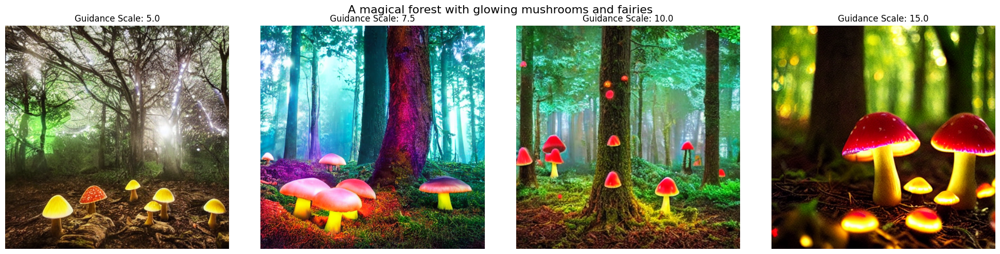

In [8]:
# Compare guidance scales
prompt = "A magical forest with glowing mushrooms and fairies"
compare_guidance_scales(pipe, prompt)

### Visualizing the Stable Diffusion Generation Process

One of the most fascinating aspects of Stable Diffusion is how it gradually refines random noise into a coherent image based on a text prompt. The `visualize_generation_steps` function allows us to peek into this process, showing how the image evolves over increasing numbers of inference steps.

### Key Points:

- We start with a minimum of 10 inference steps to ensure meaningful initial results.
- The number of steps increases gradually, up to the maximum specified (default is 50).
- The resulting visualization helps us understand how additional inference steps contribute to image quality and fidelity to the prompt.


By examining this visualization, we can gain insights into:
- How quickly the overall composition emerges
- At what point fine details start to appear
- How the image quality improves with additional computation

This function is a valuable tool for understanding the inner workings of Stable Diffusion and can help in fine-tuning the balance between generation speed and image quality.

In [9]:
def visualize_generation_steps(prompt, num_inference_steps=50, num_images=8):
    model_id = "runwayml/stable-diffusion-v1-5"
    scheduler = DDIMScheduler.from_pretrained(model_id, subfolder="scheduler")
    pipe = StableDiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, torch_dtype=torch.float16)
    pipe = pipe.to(device)

    step_images = []
    min_steps = 10  # Minimum number of inference steps
    step_sizes = [max(min_steps, i) for i in range(min_steps, num_inference_steps + 1, (num_inference_steps - min_steps) // (num_images - 1))]

    for steps in tqdm(step_sizes, desc="Generating steps"):
        image = pipe(prompt, num_inference_steps=steps).images[0]
        step_images.append(image)

    # Determine the grid size based on the actual number of generated images
    num_images = len(step_images)
    cols = min(4, num_images)
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    if rows == 1 and cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()  # Flatten the axes array for easier indexing

    for i, (img, steps) in enumerate(zip(step_images, step_sizes)):
        ax = axes[i]
        ax.imshow(img)
        ax.set_title(f"Steps: {steps}")
        ax.axis('off')

    # Turn off any unused subplots
    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    fig.suptitle(prompt, fontsize=16)
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:206: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
Generating steps:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Generating steps:  11%|█         | 1/9 [00:00<00:06,  1.32it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

Generating steps:  22%|██▏       | 2/9 [00:01<00:06,  1.06it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Generating steps:  33%|███▎      | 3/9 [00:03<00:06,  1.14s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

Generating steps:  44%|████▍     | 4/9 [00:04<00:06,  1.35s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

Generating steps:  56%|█████▌    | 5/9 [00:06<00:06,  1.58s/it]

  0%|          | 0/35 [00:00<?, ?it/s]

Generating steps:  67%|██████▋   | 6/9 [00:09<00:05,  1.82s/it]

  0%|          | 0/40 [00:00<?, ?it/s]

Generating steps:  78%|███████▊  | 7/9 [00:11<00:04,  2.07s/it]

  0%|          | 0/45 [00:00<?, ?it/s]

Generating steps:  89%|████████▉ | 8/9 [00:14<00:02,  2.34s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

Generating steps: 100%|██████████| 9/9 [00:17<00:00,  1.99s/it]


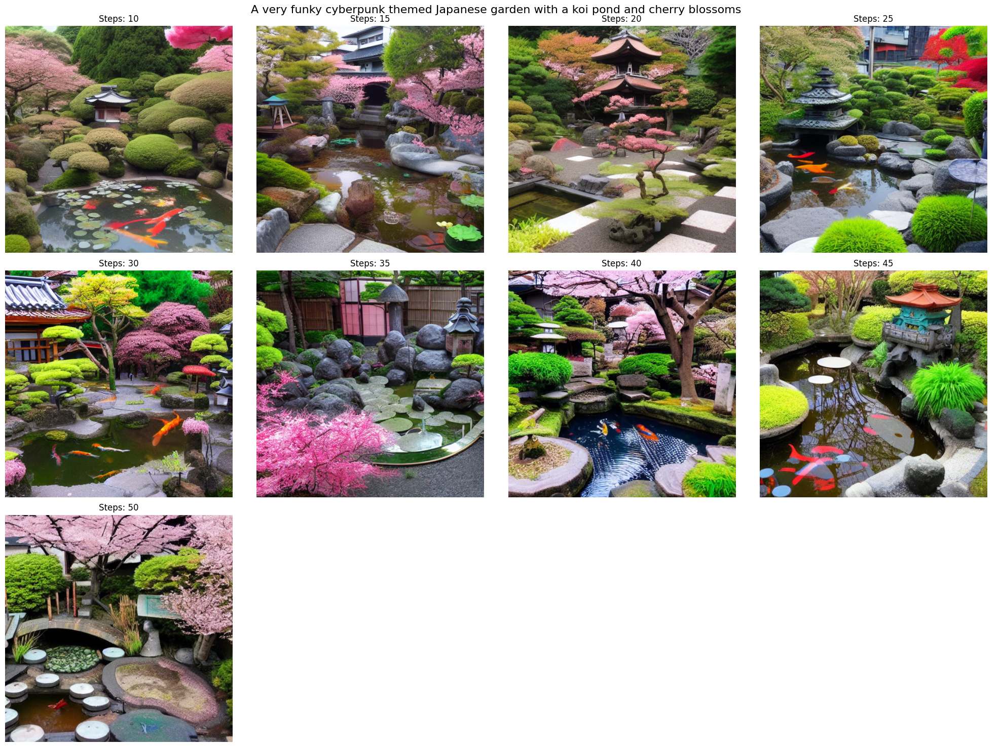

In [10]:
# Visualize generation steps
prompt = "A very funky cyberpunk themed Japanese garden with a koi pond and cherry blossoms"
visualize_generation_steps(prompt)